# CNN Codes

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
# !pip install -Uqq fastai seaborn scikit-learn wandb self-supervised

In [3]:
import wandb
import random
from fastai.vision.all import *
from fastai.callback.wandb import WandbCallback
from self_supervised.augmentations import *
from self_supervised.layers import *
from self_supervised.vision.swav import *

from sklearn.utils import shuffle

In [4]:
path = Path("/home/muhia/.fastai/data/rice-disease-classification/")
image_path = path/"Images"
files = get_image_files(image_path)

In [5]:
files[:10]

(#10) [Path('/home/muhia/.fastai/data/rice-disease-classification/Images/id_thjih1dm0x.jpg'),Path('/home/muhia/.fastai/data/rice-disease-classification/Images/id_oio1tdpw0v.jpg'),Path('/home/muhia/.fastai/data/rice-disease-classification/Images/id_rzd7i96ebi_rgn.jpg'),Path('/home/muhia/.fastai/data/rice-disease-classification/Images/id_gg54lzku6w_rgn.jpg'),Path('/home/muhia/.fastai/data/rice-disease-classification/Images/id_7dkqzspeqc_rgn.jpg'),Path('/home/muhia/.fastai/data/rice-disease-classification/Images/id_5h6byr5je6.jpg'),Path('/home/muhia/.fastai/data/rice-disease-classification/Images/id_1z4xx5omh5_rgn.jpg'),Path('/home/muhia/.fastai/data/rice-disease-classification/Images/id_cufdvyzu75_rgn.jpg'),Path('/home/muhia/.fastai/data/rice-disease-classification/Images/id_px5m0awyjx.jpg'),Path('/home/muhia/.fastai/data/rice-disease-classification/Images/id_3cfrb55mhe_rgn.jpg')]

In [6]:
train_df = pd.read_csv(path/"Train.csv")
test_df = pd.read_csv(path/"Test.csv")
sample_df = pd.read_csv(path/"SampleSubmission.csv")

In [7]:
train_df.Label.unique()

array(['blast', 'brown', 'healthy'], dtype=object)

In [8]:
test_df.head()

,Image_id
0,id_00vl5wvxq3.jpg
1,id_00vl5wvxq3_rgn.jpg
2,id_01hu05mtch.jpg
3,id_01hu05mtch_rgn.jpg
4,id_030ln10ewn.jpg


In [9]:
sample_df.head()

,Image_id,blast,brown,healthy
0,id_00vl5wvxq3.jpg,0.0,0.0,0.0
1,id_01hu05mtch.jpg,0.0,0.0,0.0
2,id_030ln10ewn.jpg,0.0,0.0,0.0
3,id_03z57m8xht.jpg,0.0,0.0,0.0
4,id_04ngep1w4b.jpg,0.0,0.0,0.0


In [10]:
size=224
bs=128

In [11]:
clas_block = DataBlock(blocks=(ImageBlock, CategoryBlock),
                       splitter=RandomSplitter(seed=42),
                       get_x=ColReader(0, pref=image_path),
                       get_y=ColReader("Label"),
                       item_tfms=Resize(size),
                       batch_tfms=[*aug_transforms(), Normalize])

In [12]:
shuf_df = shuffle(train_df, random_state=42)
dls = clas_block.dataloaders(shuf_df, bs=bs)

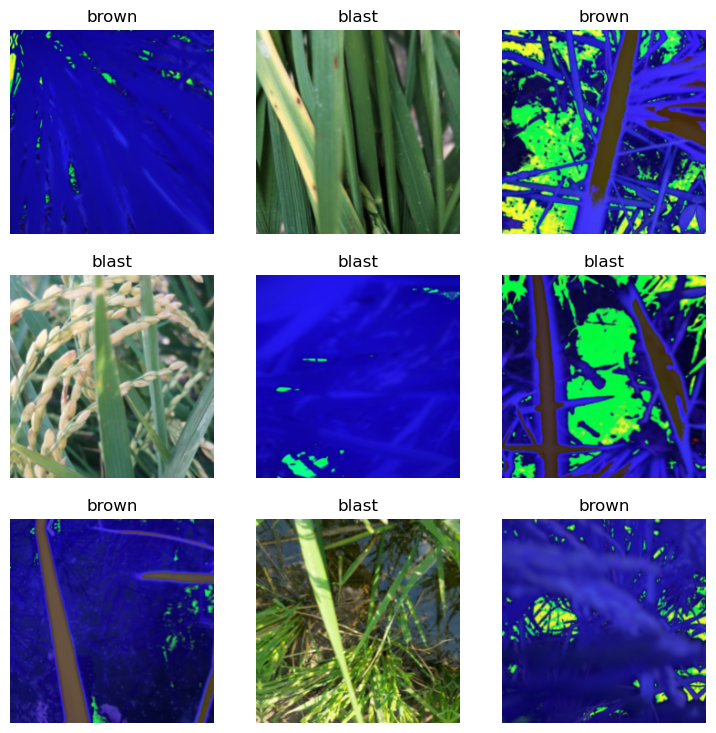

In [13]:
dls.show_batch()

In [14]:
test_dl = dls.test_dl(test_df, bs=64)

In [15]:
test_dl.n

2290

In [16]:
dls.c

3

In [17]:
dls.cuda()

In [18]:
optdict = dict(sqr_mom=0.99,mom=0.95,beta=0.,eps=1e-4)
opt_func = partial(ranger, **optdict)

In [19]:
arch = "res2next50"

In [20]:
WANDB=True
if WANDB:
    xtra_config = {"Arch": arch, "Resize": size, "Algorithm": "Pretrained SWAV", "Epochs": 100, "Size": size, "Pretrained": True, "Batch Size": bs}
    run = wandb.init(project="rice-disease-classification", config=xtra_config);

wandb: Currently logged in as: poppingtonic (nlug). Use `wandb login --relogin` to force relogin


In [27]:
# artifact = run.use_artifact('nlug/rice-disease-classification/classifier-best-res2next50-sz360:v1', type='model')
# artifact_dir = artifact.download()

In [22]:
swav_encoder = "models/run-grateful-wildflower-65-swav-res2next50-pretrain-rice-disease-epc573-sz128px-bs32_encoder.pth"

In [23]:
def split_func(m): return L(m[0], m[1]).map(params)

def create_learner(dls, arch='res2next50', encoder_path=swav_encoder) -> Learner:
    pretrained_encoder = torch.load(encoder_path)
    encoder = create_encoder(arch, pretrained=False, n_in=3)
    encoder.load_state_dict(pretrained_encoder)
    nf = encoder(torch.randn(2, 3, size, size)).size(-1) # size=128,size=224
    classifier = create_cls_module(nf, dls.c, ps=0.5)
    cbs = [SaveModelCallback(fname="latentspace-{arch}-sz{size}"),
           EarlyStoppingCallback(patience=10),
           MixUp()]
    if WANDB: cbs += [WandbCallback(log_preds=True, log_model=True)]
    model = nn.Sequential(encoder, classifier)
    learn = Learner(dls, model, opt_func=opt_func, splitter=split_func,
                    metrics=[accuracy, F.cross_entropy], loss_func=LabelSmoothingCrossEntropy(),
                    cbs=cbs)
    return learn

In [24]:
learn = create_learner(dls, encoder_path=swav_encoder)

In [25]:
learn.load("ricer-res2next50-sz224")

/home/muhia/miniconda3/envs/fastai/lib/python3.10/site-packages/fastai/learner.py:58: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


In [26]:
aug_transforms??

Signature:
aug_transforms(
    mult: 'float' = 1.0,
    do_flip: 'bool' = True,
    flip_vert: 'bool' = False,
    max_rotate: 'float' = 10.0,
    min_zoom: 'float' = 1.0,
    max_zoom: 'float' = 1.1,
    max_lighting: 'float' = 0.2,
    max_warp: 'float' = 0.2,
    p_affine: 'float' = 0.75,
    p_lighting: 'float' = 0.75,
    xtra_tfms: 'list' = None,
    size: 'int | tuple' = None,
    mode: 'str' = 'bilinear',
    pad_mode='reflection',
    align_corners=True,
    batch=False,
    min_scale=1.0,
)
Source:   
def aug_transforms(
    mult:float=1.0, # Multiplication applying to `max_rotate`,`max_lighting`,`max_warp`
    do_flip:bool=True, # Random flipping
    flip_vert:bool=False, # Flip vertically
    max_rotate:float=10., # Maximum degree of rotation
    min_zoom:float=1., # Minimum zoom 
    max_zoom:float=1.1, # Maximum zoom 
    max_lighting:float=0.2, # Maximum scale of changing brightness 
    max_warp:float=0.2, # Maximum value of changing warp per
    p_affine:float=0.75, # 

In [45]:
item_tfms = [ToTensor(), Resize(size)]
batch_tfms = [IntToFloatTensor(), *aug_transforms(), Normalize.from_stats(*imagenet_stats)]

In [175]:
interp = ClassificationInterpretation.from_learner(learn)

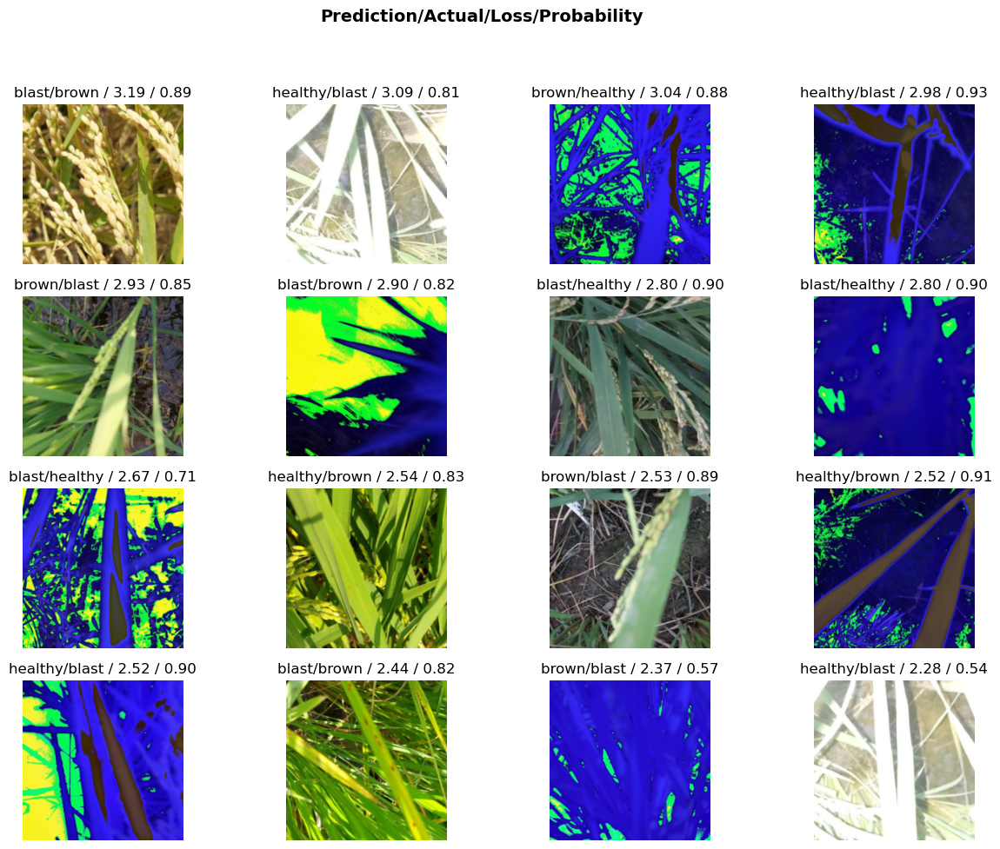

In [38]:
interp.plot_top_losses(16, figsize=(15, 11))

In [ ]:
preds, targs = learn.tta(dl=test_dl, item_tfms=item_tfms, batch_tfms=batch_tfms)

In [39]:
most_confused = interp.most_confused()

In [40]:
most_confused

[('blast', 'brown', 53),
 ('blast', 'healthy', 37),
 ('brown', 'blast', 23),
 ('brown', 'healthy', 23),
 ('healthy', 'blast', 10),
 ('healthy', 'brown', 10)]

### How good is the separation? Visualising T-SNE Projections

In [85]:
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn import manifold
from sklearn.metrics.pairwise import paired_distances
from sklearn.metrics import confusion_matrix
from scipy.spatial.distance import squareform
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.ticker import NullFormatter
import PIL

In [176]:
learn.get_preds?

Signature:
learn.get_preds(
    ds_idx=1,
    dl=None,
    with_input=False,
    with_decoded=False,
    with_loss=False,
    act=None,
    inner=False,
    reorder=True,
    cbs=None,
    *,
    save_preds: 'Path' = None,
    save_targs: 'Path' = None,
    with_preds: 'bool' = True,
    with_targs: 'bool' = True,
    concat_dim: 'int' = 0,
    pickle_protocol: 'int' = 2,
)
Docstring: Get the predictions and targets on the `ds_idx`-th dbunchset or `dl`, optionally `with_input` and `with_loss`
File:      ~/miniconda3/envs/fastai/lib/python3.10/site-packages/fastai/learner.py
Type:      method


In [181]:
preds = interp.losses
y_pred, y = learn.get_preds()

In [182]:
y_pred.size()

torch.Size([1068, 3])

In [183]:
y_pred

tensor([[0.0396, 0.0078, 0.9525],
        [0.1053, 0.4525, 0.4422],
        [0.8173, 0.1370, 0.0457],
        ...,
        [0.8672, 0.0327, 0.1001],
        [0.9221, 0.0299, 0.0480],
        [0.4868, 0.4188, 0.0944]])

In [184]:
y_pred[400]

tensor([0.2955, 0.5123, 0.1922])

In [185]:
 np.argmax(to_np(F.softmax(y_pred[400], dim=0)))

1

In [186]:
learn.dls.valid_ds.vocab[np.argmax(to_np(F.softmax(y_pred[400], dim=0)))]

'brown'

In [79]:
dir(learn.dls.valid_ds)

['__add__',
 '__addi__',
 '__annotations__',
 '__call__',
 '__class__',
 '__class__',
 '__contains__',
 '__delattr__',
 '__delattr__',
 '__delitem__',
 '__delwrap__',
 '__dict__',
 '__dict__',
 '__dir__',
 '__dir__',
 '__doc__',
 '__doc__',
 '__eq__',
 '__eq__',
 '__format__',
 '__format__',
 '__ge__',
 '__ge__',
 '__getattr__',
 '__getattr__',
 '__getattribute__',
 '__getattribute__',
 '__getitem__',
 '__getitem__',
 '__gt__',
 '__gt__',
 '__hash__',
 '__hash__',
 '__init__',
 '__init__',
 '__init_subclass__',
 '__init_subclass__',
 '__invert__',
 '__iter__',
 '__iter__',
 '__le__',
 '__le__',
 '__len__',
 '__len__',
 '__lt__',
 '__lt__',
 '__module__',
 '__module__',
 '__mul__',
 '__ne__',
 '__ne__',
 '__new__',
 '__new__',
 '__radd__',
 '__reduce__',
 '__reduce__',
 '__reduce_ex__',
 '__reduce_ex__',
 '__repr__',
 '__repr__',
 '__reversed__',
 '__setattr__',
 '__setattr__',
 '__setitem__',
 '__setstate__',
 '__signature__',
 '__signature__',
 '__sizeof__',
 '__sizeof__',
 '__stored_

In [129]:
probs_trans = TSNE(n_components=2,perplexity=50, learning_rate='auto', init='pca').fit_transform(y_pred)

/home/muhia/miniconda3/envs/fastai/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


In [130]:
prob_df = pd.DataFrame(np.concatenate((probs_trans, y[:, None]),
                                      axis=1), columns=['x', 'y', 'labels'])

In [131]:
prob_df.head(2)

,x,y,labels
0,9.116574,30.684187,2.0
1,15.478591,-0.151075,1.0


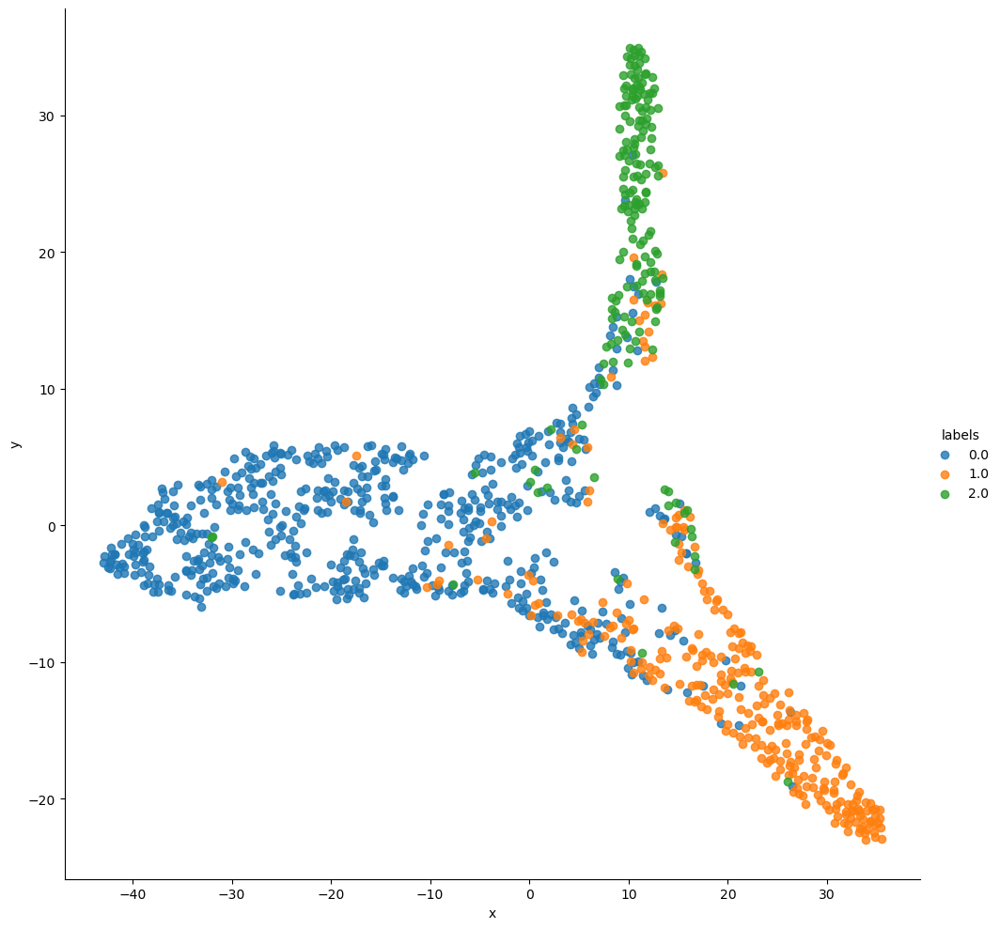

In [132]:
sns.lmplot(data=prob_df,x='x', y='y', hue='labels', fit_reg=False, legend=True, height=10)

In [211]:
probs_trans

array([[  9.116574  ,  30.684187  ],
       [ 15.478591  ,  -0.15107505],
       [-17.126171  ,  -4.9030952 ],
       ...,
       [-25.150114  ,   5.3285866 ],
       [-38.727573  ,  -0.14753862],
       [  3.6154585 ,  -7.1296525 ]], dtype=float32)

wandb: Network error (ReadTimeout), entering retry loop.


In [ ]:
prob_df.head()

In [200]:
path_df = learn.dls.valid_ds.tls.items[0].items

In [201]:
path_df.reset_index(inplace=True)

In [203]:
path_df

,index,Image_id,Label
0,1016,id_6l0f3bk2c4.jpg,healthy
1,1068,id_6z09yvx4o7.jpg,brown
2,3219,id_ln12pifq4b_rgn.jpg,blast
3,590,id_41edruxm2u.jpg,brown
4,3569,id_nv4y27abro_rgn.jpg,blast
...,...,...,...
1063,4719,id_voy1pwsh9f_rgn.jpg,brown
1064,1435,id_9bcl3l5lag_rgn.jpg,brown
1065,1075,id_70ftn35kri_rgn.jpg,blast
1066,50,id_0d6zji749f.jpg,blast


In [205]:
# test_dl.tls.items[0].items['Image_id']
prob_df['fname'] = path_df['Image_id']

In [206]:
prob_df

,x,y,labels,fname
0,9.116574,30.684187,2.0,id_6l0f3bk2c4.jpg
1,15.478591,-0.151075,1.0,id_6z09yvx4o7.jpg
2,-17.126171,-4.903095,0.0,id_ln12pifq4b_rgn.jpg
3,17.905575,-13.449712,1.0,id_41edruxm2u.jpg
4,10.311424,-10.925657,0.0,id_nv4y27abro_rgn.jpg
...,...,...,...,...
1063,18.892096,-5.407867,1.0,id_voy1pwsh9f_rgn.jpg
1064,28.419001,-15.546300,1.0,id_9bcl3l5lag_rgn.jpg
1065,-25.150114,5.328587,0.0,id_70ftn35kri_rgn.jpg
1066,-38.727573,-0.147539,0.0,id_0d6zji749f.jpg


In [209]:
def visualize_scatter_with_images(scaled_data, df, figsize=(64, 64), image_zoom=1, suffix=1):
    fig, ax = plt.subplots(figsize=figsize)
    artists = []
    xx = scaled_data[:, 0]
    yy = scaled_data[:, 1]
    
    for i, (x, y) in enumerate(zip(xx, yy)):
        im = PIL.Image.open(image_path/df['fname'][i])
        im.thumbnail((64, 64))
        img = OffsetImage(im, zoom=image_zoom, cmap='gray')
        ab = AnnotationBbox(img, (x, y), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([xx, yy]))
    ax.autoscale()
    fig.savefig(f"TSNE_{suffix}", bbox_inches='tight')
    return fig, ax

wandb: Network error (ReadTimeout), entering retry loop.


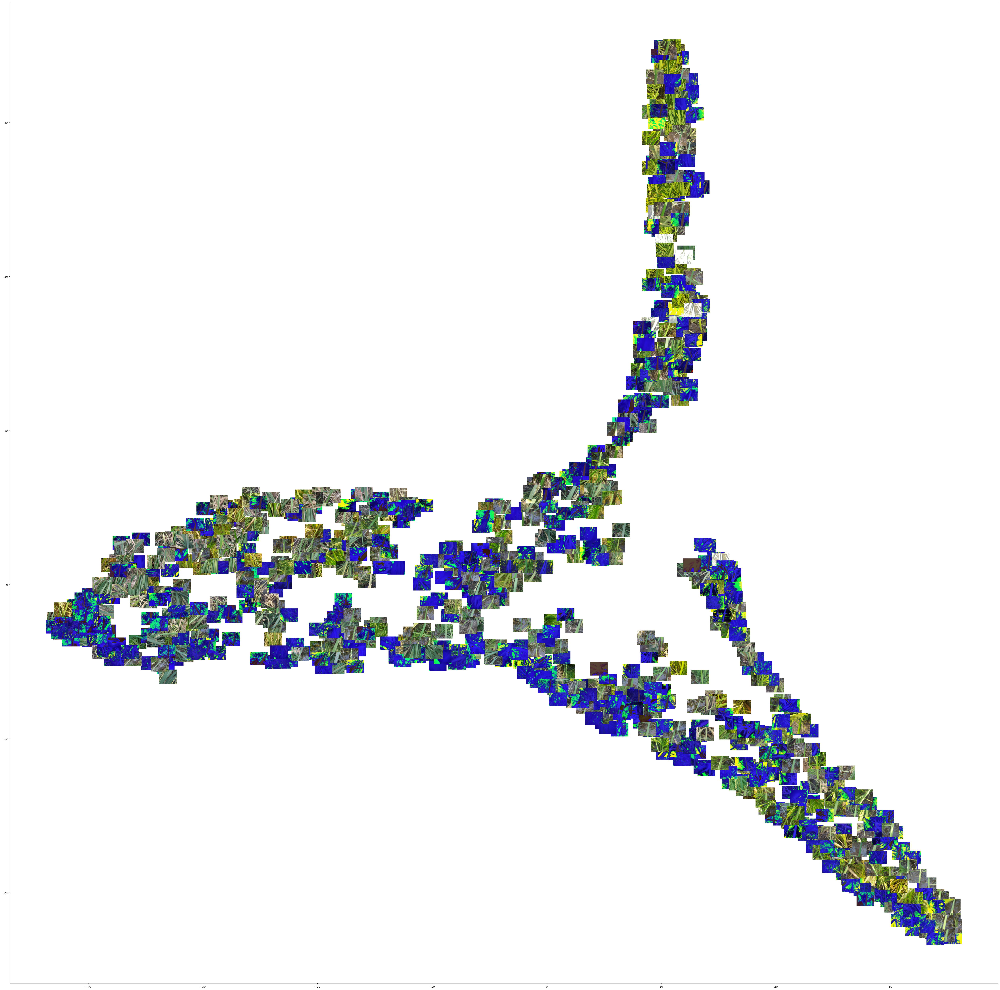

In [210]:
fig, ax = visualize_scatter_with_images(probs_trans, prob_df, image_zoom=1, suffix='logits')
plt.show()